In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from os.path import join
import scanpy as sc
import ast
import anndata
import seaborn as sns
import gc
import pickle
from pathlib import Path
from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
import warnings

from sklearn.neighbors import NearestNeighbors
from tqdm import tqdm

# Load WNB MERFISH data

In [2]:
save_dir = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results'
with open(join(save_dir, 'WMB_BG_imp_mf_sec49_20251005.pkl'), 'rb') as f:
    sec49_adata = pickle.load(f)
sec49_adata

AnnData object with n_obs × n_vars = 50986 × 8460
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol'
    uns: 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette', 'parcellation_category_palette', 'parcellation_

In [3]:
sec49_adata.obs

,brain_section_label,cluster_alias,average_correlation_score,feature_matrix_label,donor_label,donor_genotype,donor_sex,x_section,y_section,z_section,...,parcellation_organ,parcellation_category,parcellation_division,parcellation_structure,parcellation_substructure,parcellation_organ_color,parcellation_category_color,parcellation_division_color,parcellation_structure_color,parcellation_substructure_color
cell_label,,,,,,,,,,,,,,,,,,,,,
1017155956102330292,C57BL6J-638850.49,986,0.527080,C57BL6J-638850,C57BL6J-638850,wt/wt,M,3.005065,7.127176,9.2,...,brain,grey,STR,STR-unassigned,STR-unassigned,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9
1017155956101940115,C57BL6J-638850.49,1347,0.529637,C57BL6J-638850,C57BL6J-638850,wt/wt,M,4.755421,5.083911,9.2,...,brain,grey,STR,LSc,LSc,#FFFFFF,#BFDAE3,#98D6F9,#90CBED,#90CBED
1017155956101420036,C57BL6J-638850.49,1347,0.583383,C57BL6J-638850,C57BL6J-638850,wt/wt,M,6.316486,5.137176,9.2,...,brain,grey,STR,LSc,LSc,#FFFFFF,#BFDAE3,#98D6F9,#90CBED,#90CBED
1017155956101960072-1,C57BL6J-638850.49,1347,0.534940,C57BL6J-638850,C57BL6J-638850,wt/wt,M,4.462087,6.191440,9.2,...,brain,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9
1017155956101250894,C57BL6J-638850.49,1347,0.623902,C57BL6J-638850,C57BL6J-638850,wt/wt,M,6.309162,5.166135,9.2,...,brain,grey,STR,LSc,LSc,#FFFFFF,#BFDAE3,#98D6F9,#90CBED,#90CBED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017155956100590620,C57BL6J-638850.49,5254,0.503243,C57BL6J-638850,C57BL6J-638850,wt/wt,M,8.006133,6.664519,9.2,...,brain,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9
1017155956100570523,C57BL6J-638850.49,5252,0.540172,C57BL6J-638850,C57BL6J-638850,wt/wt,M,8.332069,5.837968,9.2,...,brain,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9
1017155956102630300,C57BL6J-638850.49,5252,0.543656,C57BL6J-638850,C57BL6J-638850,wt/wt,M,2.522176,5.246469,9.2,...,brain,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9


# Check distribution

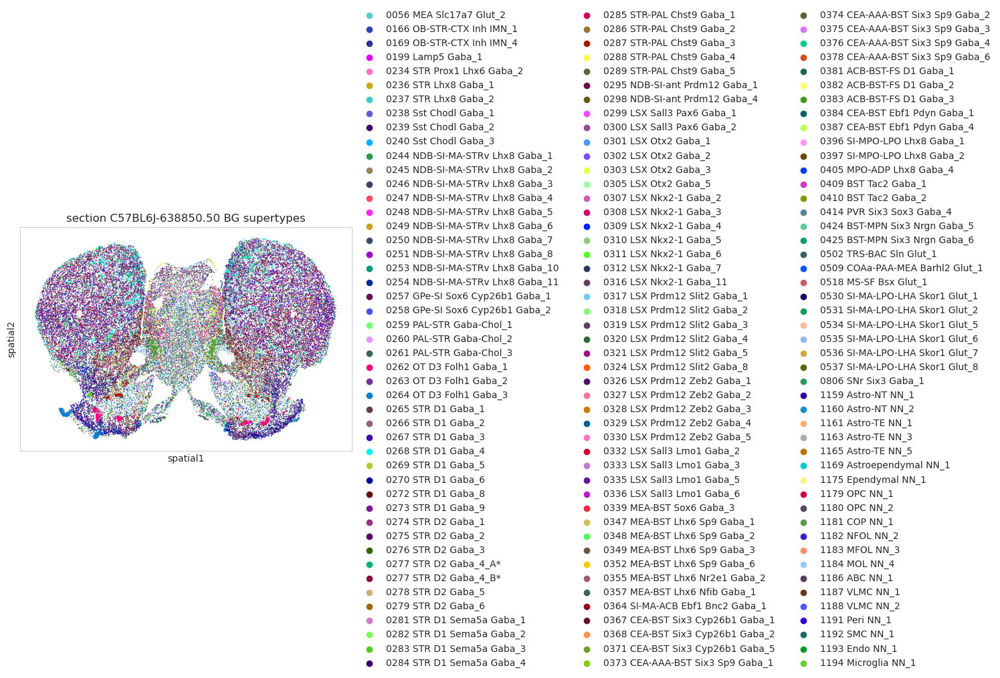

In [4]:
warnings.filterwarnings('ignore')

sc.pl.spatial(sec49_adata, color='supertype', spot_size=0.02, palette=sec49_adata.uns['supertype_palette'], title=['section C57BL6J-638850.50 BG supertypes'])

In [5]:
sec49_adata.obs['parcellation_division'].isin(['STR', 'PAL']).sum()

np.int64(50986)

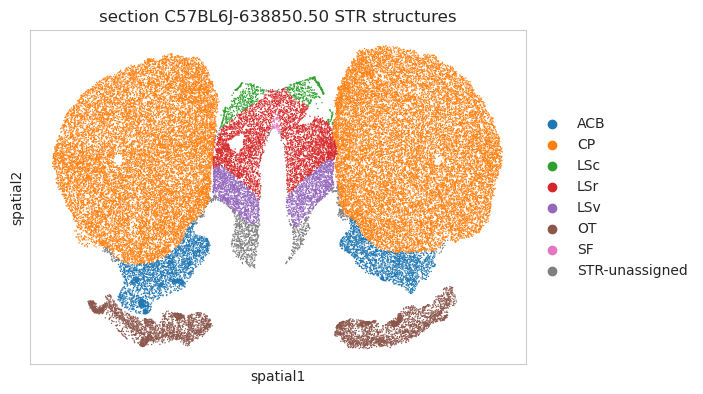

In [6]:
warnings.filterwarnings('ignore')

sc.pl.spatial(sec49_adata[sec49_adata.obs['parcellation_division'].isin(['STR'])], color='parcellation_structure', spot_size=0.02, title=['section C57BL6J-638850.50 STR structures'])

In [7]:
sec49_adata

AnnData object with n_obs × n_vars = 50986 × 8460
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol'
    uns: 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette', 'parcellation_category_palette', 'parcellation_

In [8]:
# wmb supertype list
stype_list = [
    ###
    '0262 OT D3 Folh1 Gaba_1', '0263 OT D3 Folh1 Gaba_2',
    '0264 OT D3 Folh1 Gaba_3',
    ###
    '0265 STR D1 Gaba_1', '0266 STR D1 Gaba_2',
    '0267 STR D1 Gaba_3', '0268 STR D1 Gaba_4',
    '0269 STR D1 Gaba_5', '0270 STR D1 Gaba_6',
    '0271 STR D1 Gaba_7', '0272 STR D1 Gaba_8',
    ###
    '0274 STR D2 Gaba_1', '0275 STR D2 Gaba_2',
    '0276 STR D2 Gaba_3', '0277 STR D2 Gaba_4_A*', '0277 STR D2 Gaba_4_B*',
    '0278 STR D2 Gaba_5', '0279 STR D2 Gaba_6',
    ###
    '0281 STR D1 Sema5a Gaba_1', '0282 STR D1 Sema5a Gaba_2',
    '0283 STR D1 Sema5a Gaba_3', '0284 STR D1 Sema5a Gaba_4',
    ###
    '0285 STR-PAL Chst9 Gaba_1', '0286 STR-PAL Chst9 Gaba_2',
    '0287 STR-PAL Chst9 Gaba_3', '0288 STR-PAL Chst9 Gaba_4',
    '0288 STR-PAL Chst9 Gaba_4', '0288 STR-PAL Chst9 Gaba_5'
]

sec49_adata[sec49_adata.obs['supertype'].isin(stype_list)].obs['class'].unique()

['09 CNU-LGE GABA']
Categories (1, object): ['09 CNU-LGE GABA']

# Nearst Neighbors Calculation

In [9]:
# query data (for covering all the space)
query_adata = sec49_adata[sec49_adata.obs['parcellation_structure'].isin(['CP', 'ACB', 'OT'])]
query_adata

View of AnnData object with n_obs × n_vars = 36100 × 8460
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol'
    uns: 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette', 'parcellation_category_palette', 'parce

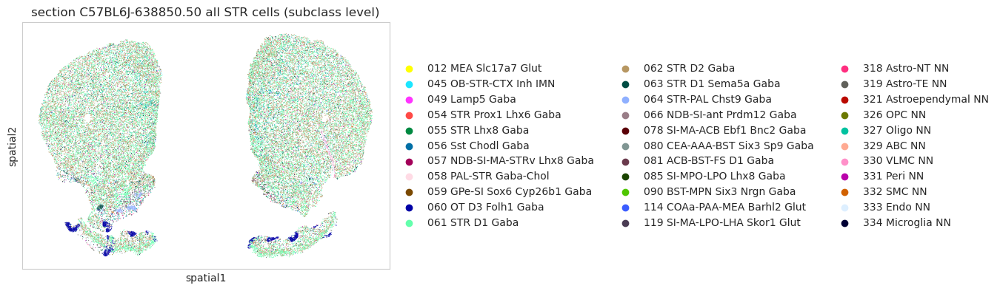

In [10]:
warnings.filterwarnings('ignore')

sc.pl.spatial(query_adata, color='subclass', spot_size=0.015, title=['section C57BL6J-638850.50 all STR cells (subclass level)'])

In [11]:
# reference data types (for quantiying neighbor types)
stype_list

['0262 OT D3 Folh1 Gaba_1',
 '0263 OT D3 Folh1 Gaba_2',
 '0264 OT D3 Folh1 Gaba_3',
 '0265 STR D1 Gaba_1',
 '0266 STR D1 Gaba_2',
 '0267 STR D1 Gaba_3',
 '0268 STR D1 Gaba_4',
 '0269 STR D1 Gaba_5',
 '0270 STR D1 Gaba_6',
 '0271 STR D1 Gaba_7',
 '0272 STR D1 Gaba_8',
 '0274 STR D2 Gaba_1',
 '0275 STR D2 Gaba_2',
 '0276 STR D2 Gaba_3',
 '0277 STR D2 Gaba_4_A*',
 '0277 STR D2 Gaba_4_B*',
 '0278 STR D2 Gaba_5',
 '0279 STR D2 Gaba_6',
 '0281 STR D1 Sema5a Gaba_1',
 '0282 STR D1 Sema5a Gaba_2',
 '0283 STR D1 Sema5a Gaba_3',
 '0284 STR D1 Sema5a Gaba_4',
 '0285 STR-PAL Chst9 Gaba_1',
 '0286 STR-PAL Chst9 Gaba_2',
 '0287 STR-PAL Chst9 Gaba_3',
 '0288 STR-PAL Chst9 Gaba_4',
 '0288 STR-PAL Chst9 Gaba_4',
 '0288 STR-PAL Chst9 Gaba_5']

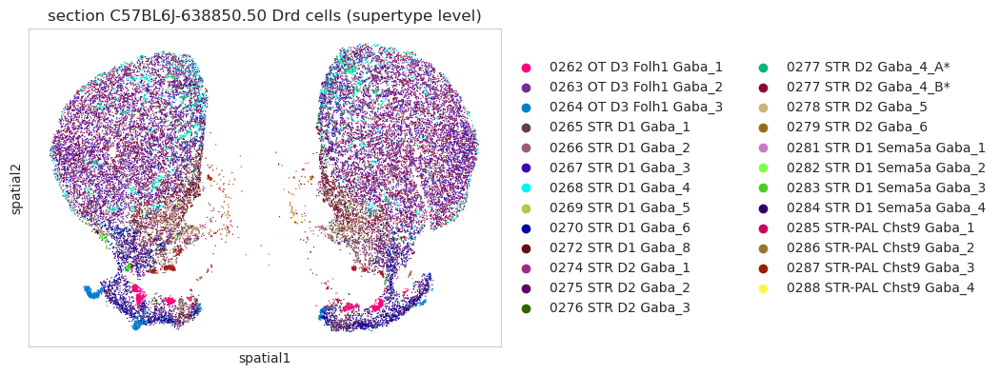

In [12]:
ref_adata = sec49_adata[sec49_adata.obs['supertype'].isin(stype_list)]
sc.pl.spatial(ref_adata, color='supertype', palette=sec49_adata.uns['supertype_palette'],
              spot_size=0.02, title=['section C57BL6J-638850.50 Drd cells (supertype level)'])

In [13]:
# Calculate spatial K nearest neighbors
#X_spatial = np.array(scdatamer.obsm['X_spatial_rotated'])
# ref_cond = (scdatamer.obs['Class_name'] == 'CN LGE GABA').values

# only use the CN LGE GABA populations as your reference spatial coordiante upon which we will create the KNN tree
# X_spatial_ref = X_spatial[ref_cond]
X_spatial_ref = ref_adata.obsm['spatial'][:, :2]

# the cells whose cell type composition we want to calculate
# query_cond = scdatamer.obs['spatialmodule_GrayMatter_subclustered'] == 'STRd'
X_spatial_query = query_adata.obsm['spatial'][:, :2]

K = 40

nbrs = NearestNeighbors(n_neighbors=K, algorithm='ball_tree').fit(X_spatial_ref)
distances, indices = nbrs.kneighbors(X_spatial_query)
print('Mean KNN distance =', np.mean(distances))

# Get the cell types of each cell's KNN
neighbor_vec = len(np.unique(ref_adata.obs['supertype']))
neighbor_type2id = {n_type:i for i, n_type in enumerate(np.unique(ref_adata.obs['supertype']))}

knn_cts = np.array(ref_adata.obs['supertype'])[indices]

# # Generate the matrix of neighbor cell types
X_query_neighbor_vec = np.zeros((len(X_spatial_query), neighbor_vec))
for i in tqdm(range(len(X_spatial_query)), desc='computing neigborhood graph'):

    # Estimate the charasteristic neighbor distance
    neighbor_R0 = 2 * np.quantile(distances[i], max(0.1, 5 / K))
    for j in range(K):

        ct_neighbor_id = neighbor_type2id[knn_cts[i, j]]

        X_query_neighbor_vec[i, ct_neighbor_id] += np.exp(- (distances[i, j] / neighbor_R0) ** 2)


Mean KNN distance = 0.055684751153050514


computing neigborhood graph: 100%|██████████| 36100/36100 [00:03<00:00, 11164.26it/s]


In [14]:
X_query_neighbor_vec.shape

(36100, 25)

In [15]:
module_adata = sc.AnnData(X_query_neighbor_vec)
module_adata.obsm['spatial'] = query_adata.obsm['spatial']

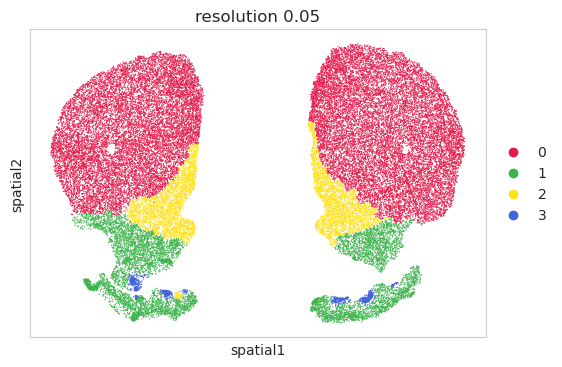

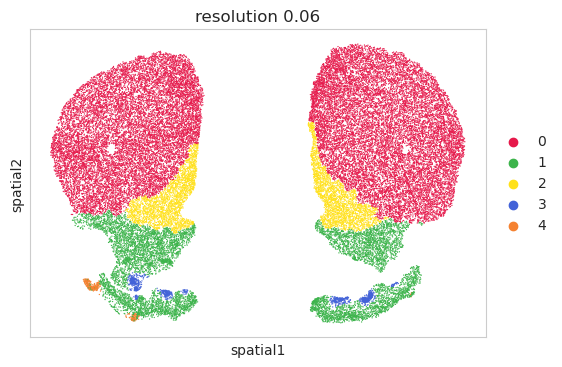

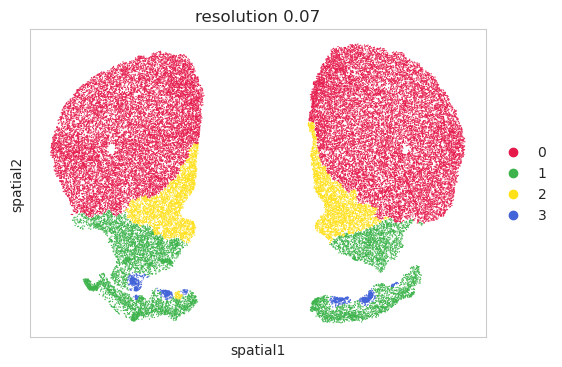

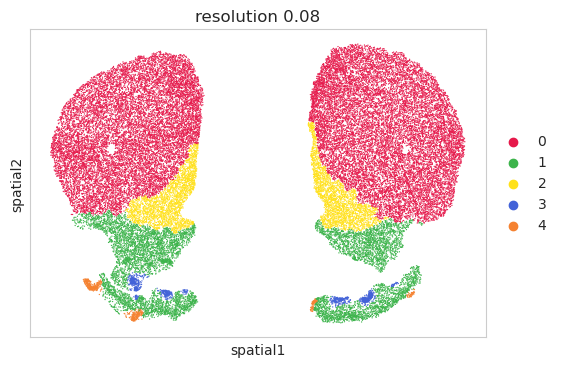

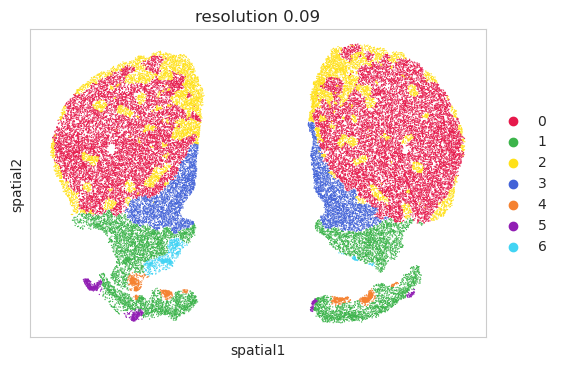

...

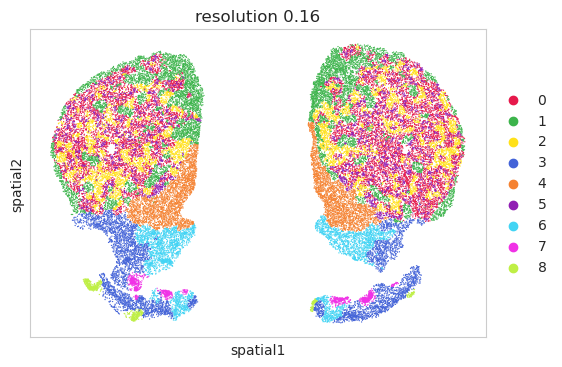

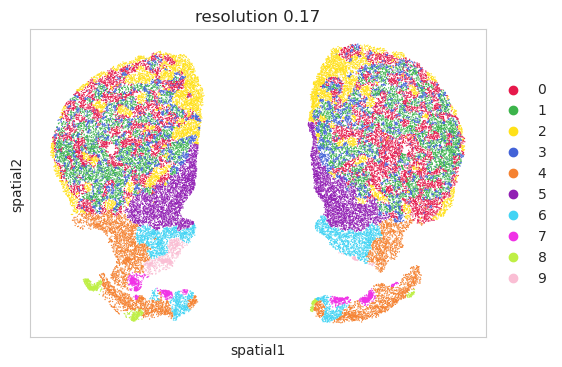

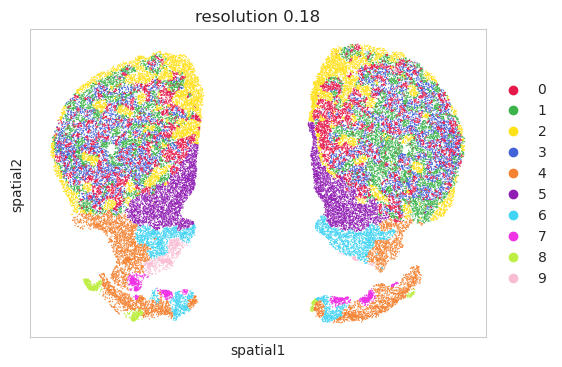

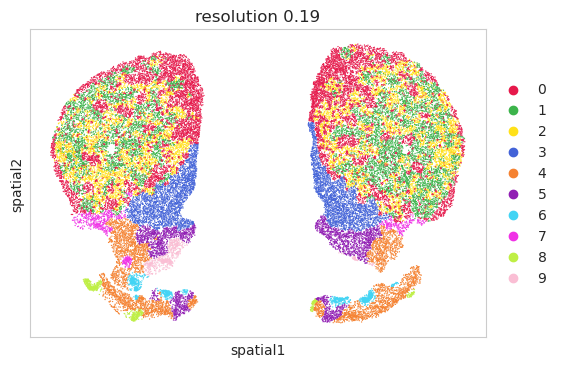

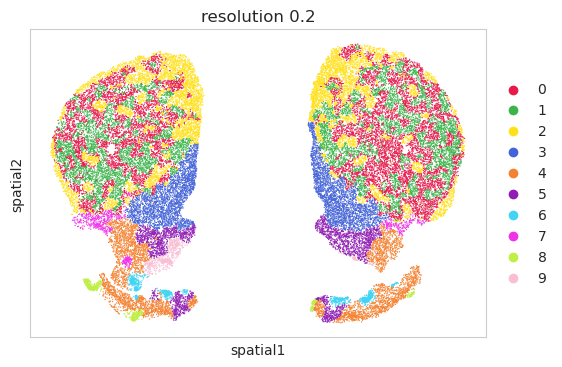

In [16]:
# test for different n_neighbors and resolution parameters
cmap_full = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45", "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1", "#000075", "#a9a9a9"]

sc.pp.neighbors(module_adata, n_neighbors=20, use_rep='X')
for res in [0.05, 0.06, 0.07, 0.08, 0.09, 0.10, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2]:
    sc.tl.leiden(module_adata, resolution=res)
    with plt.rc_context({'figure.figsize':(7, 4)}):
        sc.pl.spatial(module_adata, color='leiden', palette=cmap_full,
                      spot_size=0.02, title='resolution {}'.format(res))

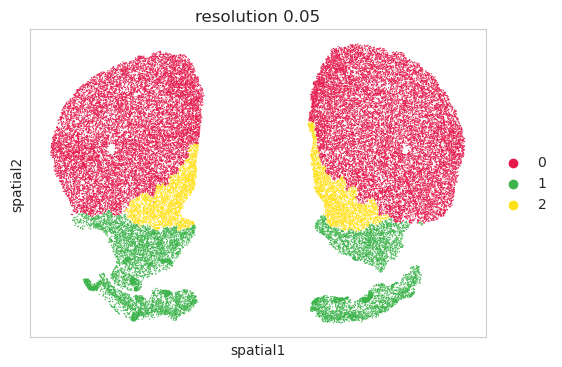

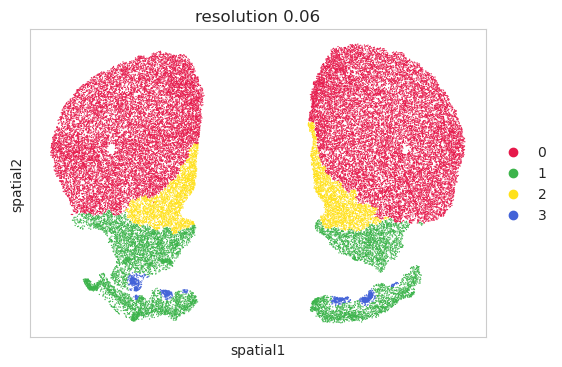

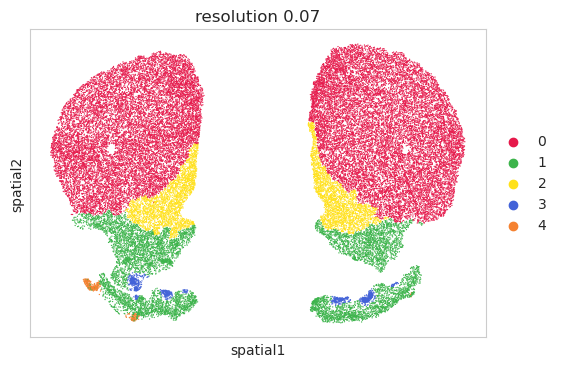

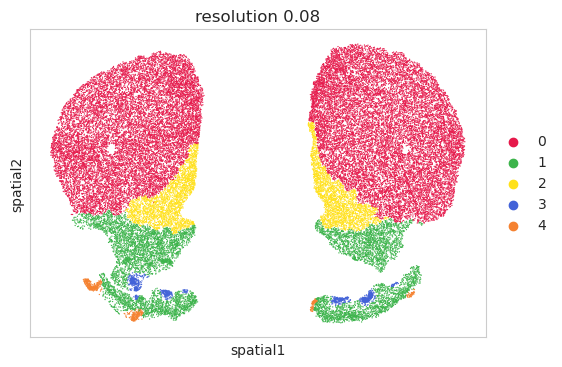

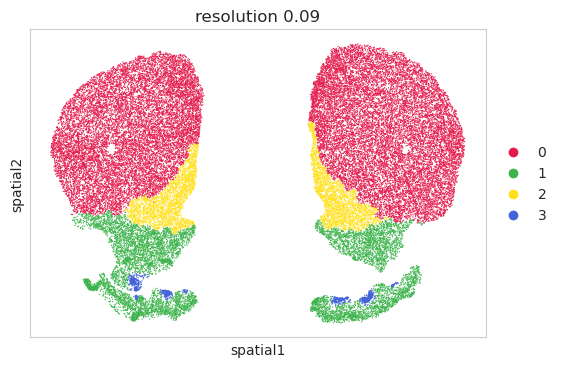

...

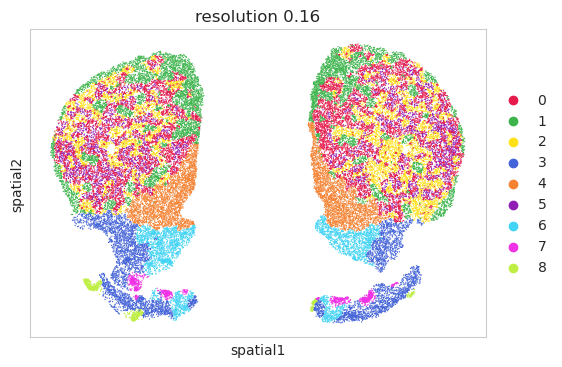

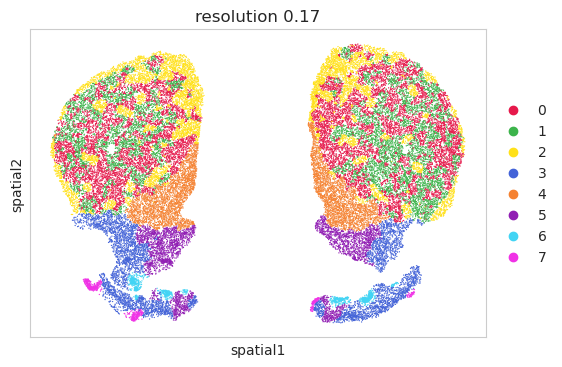

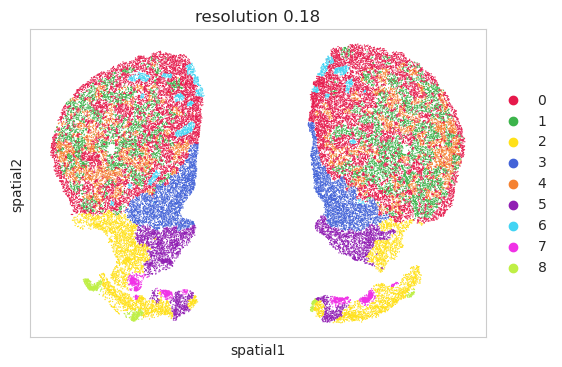

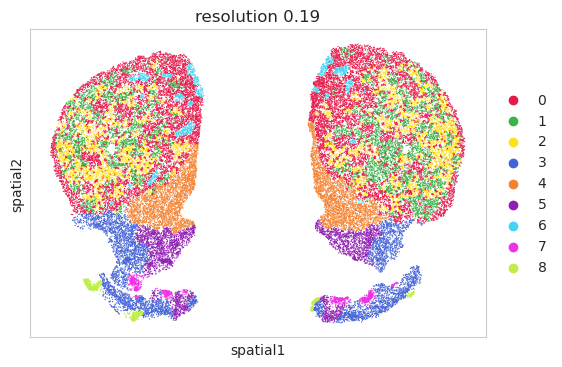

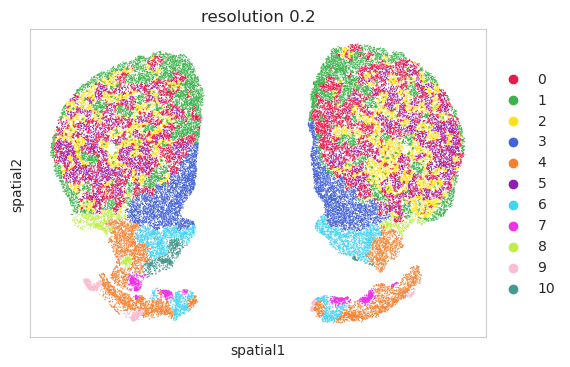

In [17]:
# test for different n_neighbors and resolution parameters

cmap_full = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45", "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1", "#000075", "#a9a9a9"]

sc.pp.neighbors(module_adata, n_neighbors=30, use_rep='X')
for res in [0.05, 0.06, 0.07, 0.08, 0.09, 0.10, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2]:
    sc.tl.leiden(module_adata, resolution=res)
    with plt.rc_context({'figure.figsize':(7, 4)}):
        sc.pl.spatial(module_adata, color='leiden', palette=cmap_full,
                      spot_size=0.02, title='resolution {}'.format(res))

In [46]:
%%time
sc.pp.neighbors(module_adata, n_neighbors=20, use_rep='X')
sc.tl.umap(module_adata, random_state=0, min_dist=0.1)

CPU times: user 2min 38s, sys: 181 ms, total: 2min 38s
Wall time: 15.5 s


In [47]:
sc.tl.leiden(module_adata, resolution=0.09)
np.unique(module_adata.obs['leiden'])

array(['0', '1', '2', '3', '4', '5', '6'], dtype=object)

In [48]:
cmap_full = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45", "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1", "#000075", "#a9a9a9"]

cmap = [ "#f58231", "#ffe119", "#911eb4", "#e6194B", "#4363d8", "#aaffc3"]
module_adata.uns['cmap'] = cmap

Length of palette colors is smaller than the number of categories (palette length: 6, categories length: 7. Some categories will have the same color.


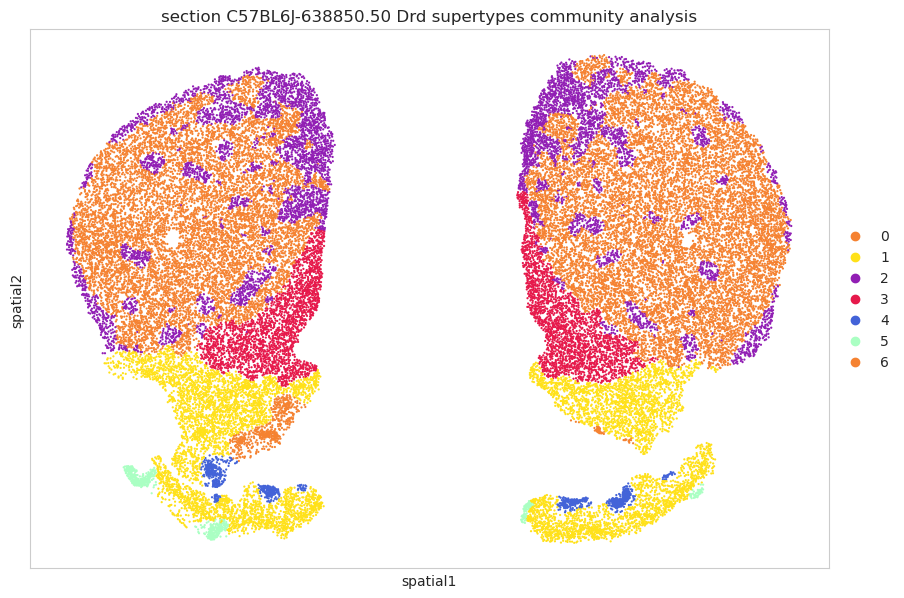

In [49]:
with plt.rc_context({'figure.figsize':(15, 7)}):
    sc.pl.spatial(module_adata, color='leiden', palette=module_adata.uns['cmap'],
                  spot_size=0.02, title=['section C57BL6J-638850.50 Drd supertypes community analysis'])

In [50]:
# combine cluster 1/3/4/5 for STRv
module_adata.obs['leiden'][module_adata.obs['leiden'].isin(['1', '3', '4', '5', '6'])] = '1'
module_adata.obs['leiden'] = module_adata.obs['leiden'].cat.set_categories(['0', '1', '2'])
module_adata.obs['leiden'].dtype

CategoricalDtype(categories=['0', '1', '2'], ordered=False, categories_dtype=object)

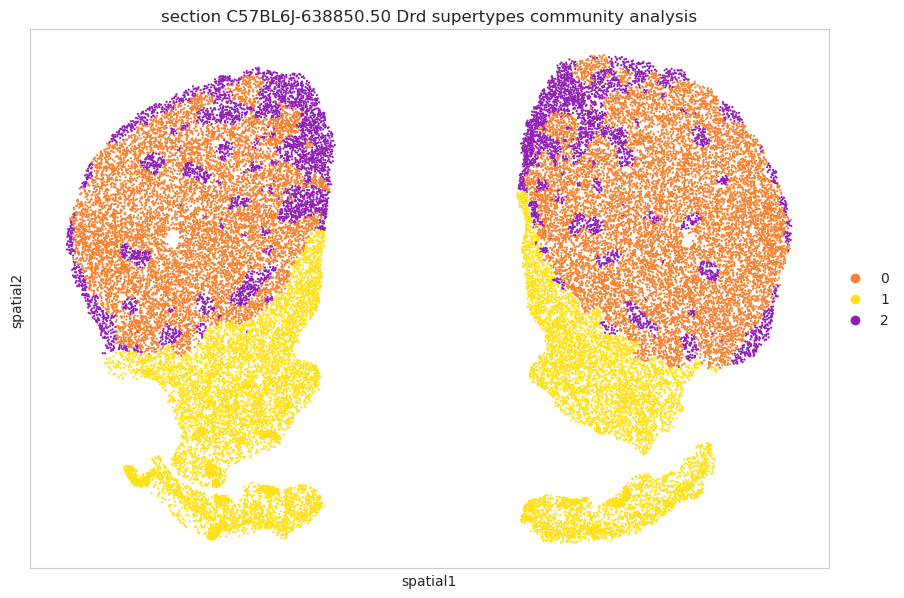

In [51]:
with plt.rc_context({'figure.figsize':(15, 7)}):
    sc.pl.spatial(module_adata, color='leiden', palette=module_adata.uns['cmap'],
                  spot_size=0.02, title=['section C57BL6J-638850.50 Drd supertypes community analysis'])

In [52]:
cmap = ["#f58231", "#647FBC", "#911eb4"]
module_adata.uns['cmap']=cmap

Text(0.5, 1.0, 'Neuron cell type based community clustering of 36,100 cells')

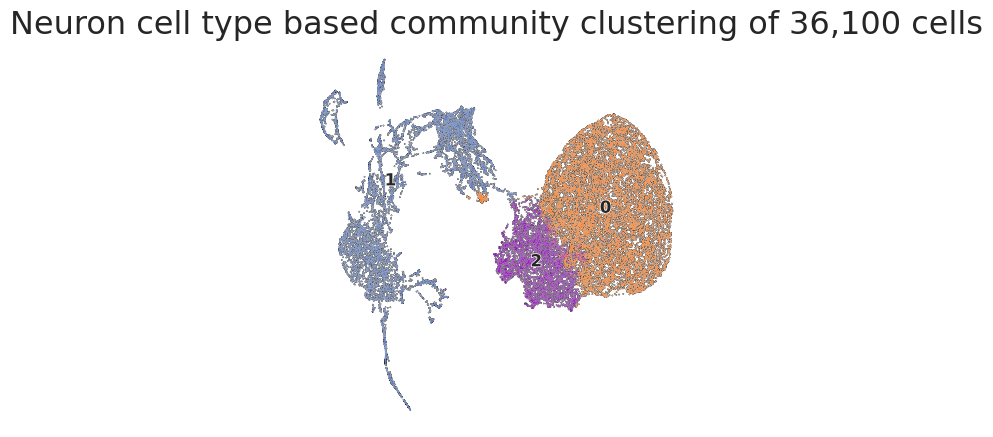

In [53]:
fig, ax = plt.subplots(dpi=100, figsize=(5,5))

sc.pl.umap(
    module_adata,
    color="leiden",
    add_outline=True,
    legend_loc="on data",
    legend_fontsize=12,
    legend_fontoutline=1,
    size = 2,
    frameon=False,
    palette=module_adata.uns['cmap'],
    ax = ax,
    show = False
)
ax.set_title(f"Neuron cell type based community clustering of {len(module_adata):,d} cells", fontdict = {'fontsize':23})


In [54]:
module_adata

AnnData object with n_obs × n_vars = 36100 × 25
    obs: 'leiden', 'module'
    uns: 'neighbors', 'leiden', 'leiden_colors', 'umap', 'cmap', 'module_palette', 'module_colors'
    obsm: 'spatial', 'X_umap'
    obsp: 'distances', 'connectivities'

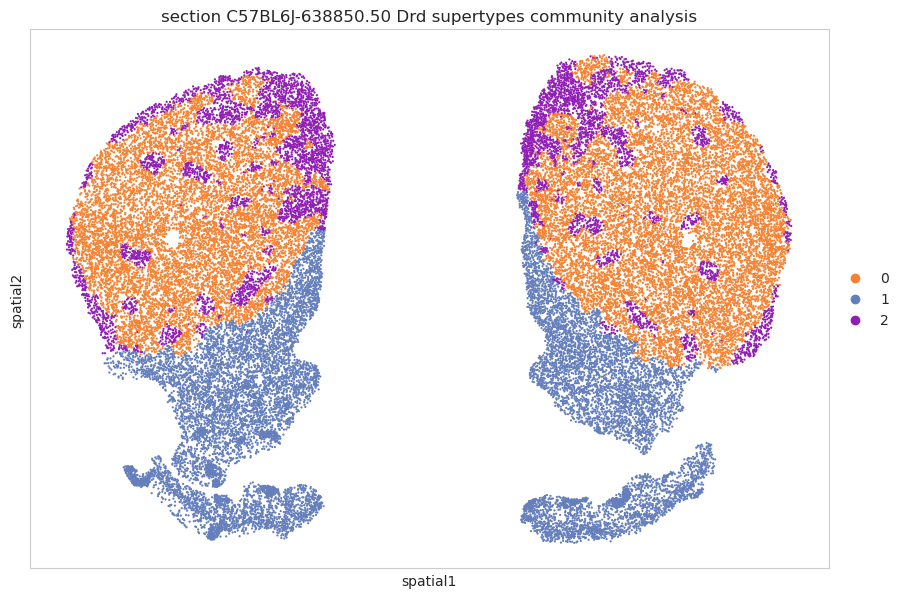

In [55]:
with plt.rc_context({'figure.figsize':(15, 7)}):
    sc.pl.spatial(module_adata,
                  color='leiden', palette=module_adata.uns['cmap'],
                  spot_size=0.02, title=['section C57BL6J-638850.50 Drd supertypes community analysis'])

In [56]:
module_adata

AnnData object with n_obs × n_vars = 36100 × 25
    obs: 'leiden', 'module'
    uns: 'neighbors', 'leiden', 'leiden_colors', 'umap', 'cmap', 'module_palette', 'module_colors'
    obsm: 'spatial', 'X_umap'
    obsp: 'distances', 'connectivities'

In [57]:
query_adata

AnnData object with n_obs × n_vars = 36100 × 8460
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color', 'module'
    var: 'gene_symbol'
    uns: 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette', 'parcellation_category_palette', 'par

In [58]:
# annotate the results
# 0: matrix, 2: striosome
spatial_modules = []
for i in range(len(module_adata)):
    lei = module_adata.obs['leiden'].iloc[i]
    if lei == '0':
        spatial_modules.append('STRd matrix')
    elif lei == '1':
        spatial_modules.append('STRv')
    elif lei == '2':
        spatial_modules.append('STRd striosome')

module_adata.obs['module'] = spatial_modules
query_adata.obs['module'] = spatial_modules
query_adata.obs

,brain_section_label,cluster_alias,average_correlation_score,feature_matrix_label,donor_label,donor_genotype,donor_sex,x_section,y_section,z_section,...,parcellation_category,parcellation_division,parcellation_structure,parcellation_substructure,parcellation_organ_color,parcellation_category_color,parcellation_division_color,parcellation_structure_color,parcellation_substructure_color,module
cell_label,,,,,,,,,,,,,,,,,,,,,
1017155956101960072-1,C57BL6J-638850.49,1347,0.534940,C57BL6J-638850,C57BL6J-638850,wt/wt,M,4.462087,6.191440,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRv
1017155956201930350,C57BL6J-638850.49,1347,0.626035,C57BL6J-638850,C57BL6J-638850,wt/wt,M,4.502663,4.823652,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd striosome
1017155956101250761,C57BL6J-638850.49,1347,0.660319,C57BL6J-638850,C57BL6J-638850,wt/wt,M,6.332413,5.325038,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd striosome
1017155956201930346,C57BL6J-638850.49,1347,0.602237,C57BL6J-638850,C57BL6J-638850,wt/wt,M,4.500871,4.834046,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd striosome
1017155956101240733,C57BL6J-638850.49,1347,0.648400,C57BL6J-638850,C57BL6J-638850,wt/wt,M,6.587155,4.522467,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd striosome
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017155956100930382,C57BL6J-638850.49,5252,0.632928,C57BL6J-638850,C57BL6J-638850,wt/wt,M,7.242226,6.271861,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd matrix
1017155956100590620,C57BL6J-638850.49,5254,0.503243,C57BL6J-638850,C57BL6J-638850,wt/wt,M,8.006133,6.664519,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd matrix
1017155956100570523,C57BL6J-638850.49,5252,0.540172,C57BL6J-638850,C57BL6J-638850,wt/wt,M,8.332069,5.837968,9.2,...,grey,STR,CP,CP,#FFFFFF,#BFDAE3,#98D6F9,#98D6F9,#98D6F9,STRd matrix


In [59]:
module_palette = {
    'STRd matrix': '#f58231',
    'STRd striosome': '#911eb4',
    'STRv': '#647FBC'
}


query_adata.uns['module_palette'] = module_palette
module_adata.uns['module_palette'] = module_palette
query_adata

AnnData object with n_obs × n_vars = 36100 × 8460
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color', 'module'
    var: 'gene_symbol'
    uns: 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette', 'parcellation_category_palette', 'par

In [60]:
save_dir = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/panels/striosome_border/sec49'

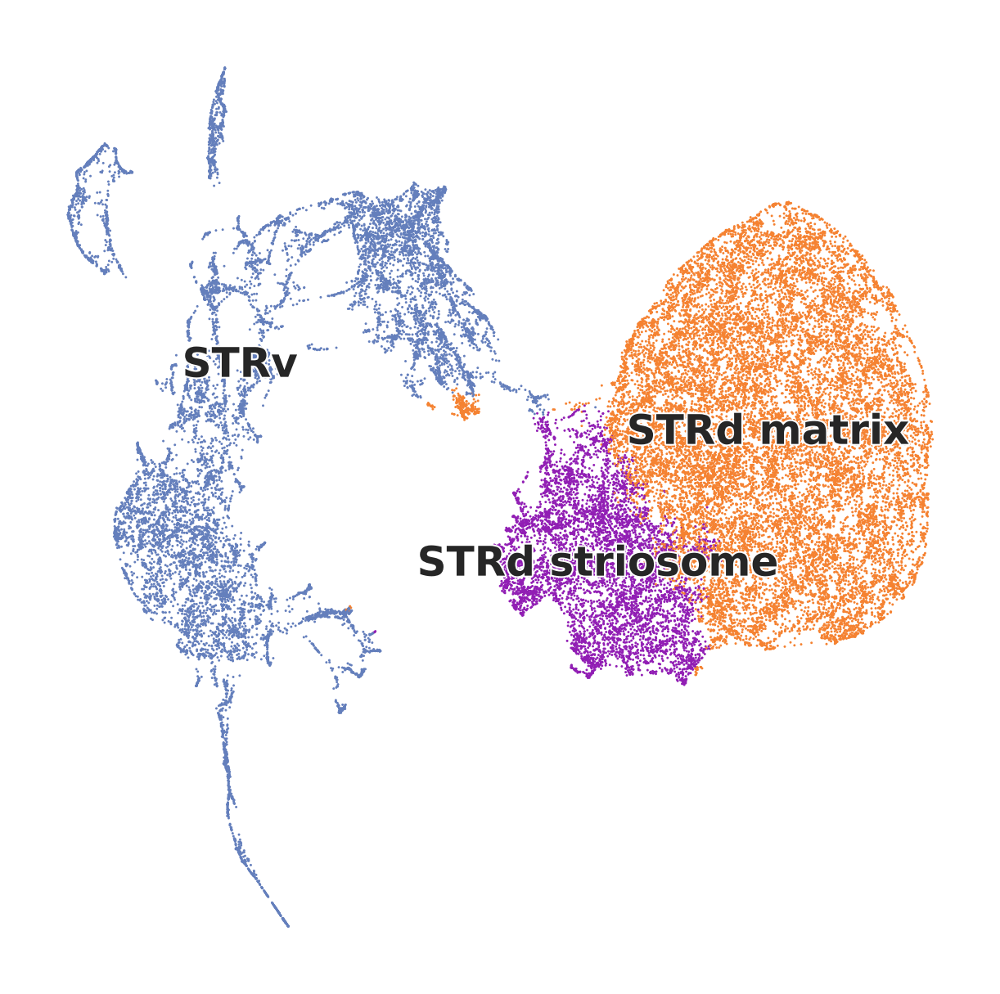

In [61]:
fig, ax = plt.subplots(dpi=300, figsize=(5,5))
sc.pl.umap(
    module_adata,
    color="module",
    # add_outline=True,
    legend_loc="on data",
    legend_fontsize=12,
    legend_fontoutline=1,
    size = 2,
    frameon=False,
    palette=module_adata.uns['module_palette'],
    ax = ax,
    show = False,
    title=''
)

plt.savefig(join(save_dir, 'community_clustering.tif'), format='tif', bbox_inches="tight")

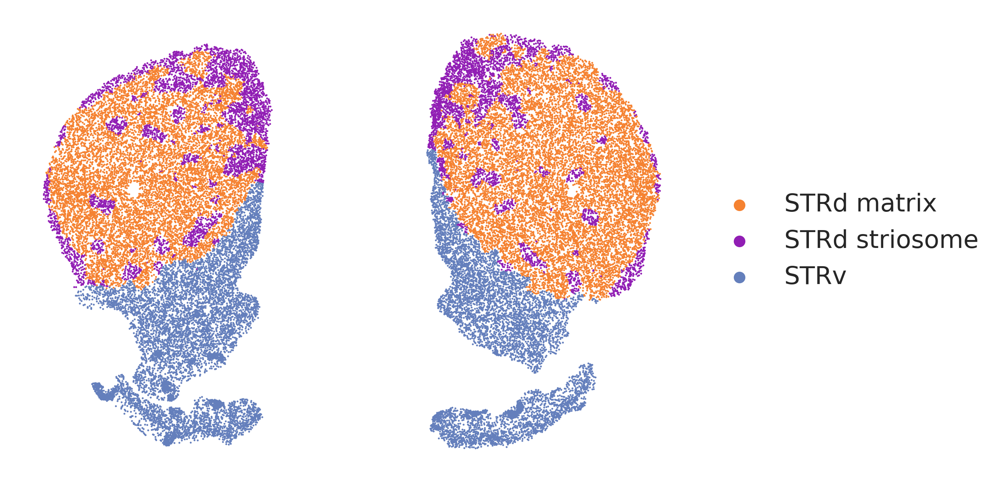

In [62]:
fig, ax = plt.subplots(dpi=300, figsize=(15,5))
sc.pl.spatial(query_adata, color='module', palette=query_adata.uns['module_palette'],
              spot_size=0.02, title='', ax=ax, frameon=False, show=False,
              legend_fontsize=15, legend_fontweight='black')

plt.savefig(join(save_dir, 'community_spatial.tif'), format='tif', bbox_inches="tight")

In [63]:
# save the resutls
import pickle
save_path = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/striosome_community_detection_sec49_20251005.pkl'
with open(save_path, 'wb') as f:
    pickle.dump(query_adata, f)